<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Изучение-данных-из-файла" data-toc-modified-id="Изучение-данных-из-файла-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Изучение данных из файла</a></span></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Предобработка данных</a></span></li><li><span><a href="#Расчеты-и-добавление-результатов-в-таблицу" data-toc-modified-id="Расчеты-и-добавление-результатов-в-таблицу-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Расчеты и добавление результатов в таблицу</a></span></li><li><span><a href="#Исследовательский-анализ-данных" data-toc-modified-id="Исследовательский-анализ-данных-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Исследовательский анализ данных</a></span></li></ul></div>

# Исследование объявлений о продаже квартир

В вашем распоряжении данные сервиса Яндекс.Недвижимость — архив объявлений о продаже квартир в Санкт-Петербурге и соседних населённых пунктах за несколько лет. Нужно научиться определять рыночную стоимость объектов недвижимости. Ваша задача — установить параметры. Это позволит построить автоматизированную систему: она отследит аномалии и мошенническую деятельность. 

По каждой квартире на продажу доступны два вида данных. Первые вписаны пользователем, вторые получены автоматически на основе картографических данных. Например, расстояние до центра, аэропорта, ближайшего парка и водоёма. 

## Изучение данных из файла

In [1]:
# импортируем библиотеки
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt 
import plotly.express as px

In [2]:
# прочитаем файл, разделим колонки
data = pd.read_csv('/datasets/real_estate_data.csv', sep='\t') 

# просмотрим общую информацию о таблице
data.info() 
display(data.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
total_images            23699 non-null int64
last_price              23699 non-null float64
total_area              23699 non-null float64
first_day_exposition    23699 non-null object
rooms                   23699 non-null int64
ceiling_height          14504 non-null float64
floors_total            23613 non-null float64
living_area             21796 non-null float64
floor                   23699 non-null int64
is_apartment            2775 non-null object
studio                  23699 non-null bool
open_plan               23699 non-null bool
kitchen_area            21421 non-null float64
balcony                 12180 non-null float64
locality_name           23650 non-null object
airports_nearest        18157 non-null float64
cityCenters_nearest     18180 non-null float64
parks_around3000        18181 non-null float64
parks_nearest           8079 non-null float64
ponds_around300

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.0,2019-03-07T00:00:00,3,2.70,16.0,51.0,8,NaN,...,25.0,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000.0,40.4,2018-12-04T00:00:00,1,NaN,11.0,18.6,1,NaN,...,11.0,2.0,посёлок Шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
2,10,5196000.0,56.0,2015-08-20T00:00:00,2,NaN,5.0,34.3,4,NaN,...,8.3,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000.0,159.0,2015-07-24T00:00:00,3,NaN,14.0,NaN,9,NaN,...,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000.0,100.0,2018-06-19T00:00:00,2,3.03,14.0,32.0,13,NaN,...,41.0,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0


**Вывод**  
  
В файле указаны 23699 объектов недвижимости, каждый из которых имеет 22 характеристики. 

1.	airports_nearest — расстояние до ближайшего аэропорта в метрах (м) – количественная переменная
2.	balcony — число балконов – количественная переменная
3.	ceiling_height — высота потолков (м) – количественная переменная
4.	cityCenters_nearest — расстояние до центра города (м) – количественная переменная
5.	days_exposition — сколько дней было размещено объявление (от публикации до снятия) – количественная переменная
6.	first_day_exposition — дата публикации – количественная переменная
7.	floor — этаж – количественная переменная 
8.	floors_total — всего этажей в доме – количественная переменная
9.	is_apartment — апартаменты (булев тип) – категориальная переменная
10.	kitchen_area — площадь кухни в квадратных метрах (м²) – количественная переменная
11.	last_price — цена на момент снятия с публикации – количественная переменная
12.	living_area — жилая площадь в квадратных метрах(м²) – количественная переменная
13.	locality_name — название населённого пункта
14.	open_plan — свободная планировка (булев тип) – категориальная переменная
15.	parks_around3000 — число парков в радиусе 3 км – количественная переменная
16.	parks_nearest — расстояние до ближайшего парка (м) – количественная переменная
17.	ponds_around3000 — число водоёмов в радиусе 3 км – количественная переменная
18.	ponds_nearest — расстояние до ближайшего водоёма (м) – количественная переменная
19.	rooms — число комнат – количественная переменная
20.	studio — квартира-студия (булев тип) – категориальная переменная
21.	total_area — площадь квартиры в квадратных метрах (м²) – количественная переменная
22.	total_images — число фотографий квартиры в объявлении – количественная переменная

Тип данных у столбцов: bool(2), float64(14), int64(3), object(3)
В некоторых характеристиках есть пропущенные значения, которые необходимо заменить.


## Предобработка данных

In [3]:
# изучим данные в таблице на предмет аномалий
data.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,23699.000000,2.369900e+04,23699.000000,23699.000000,14504.000000,23613.000000,21796.000000,23699.000000,21421.000000,12180.000000,18157.000000,18180.000000,18181.000000,8079.000000,18181.000000,9110.000000,20518.000000
mean,9.858475,6.541549e+06,60.348651,2.070636,2.771499,10.673824,34.457852,5.892358,10.569807,1.150082,28793.672193,14191.277833,0.611408,490.804555,0.770255,517.980900,180.888634
std,5.682529,1.088701e+07,35.654083,1.078405,1.261056,6.597173,22.030445,4.885249,5.905438,1.071300,12630.880622,8608.386210,0.802074,342.317995,0.938346,277.720643,219.727988
min,0.000000,1.219000e+04,12.000000,0.000000,1.000000,1.000000,2.000000,1.000000,1.300000,0.000000,0.000000,181.000000,0.000000,1.000000,0.000000,13.000000,1.000000
25%,6.000000,3.400000e+06,40.000000,1.000000,2.520000,5.000000,18.600000,2.000000,7.000000,0.000000,18585.000000,9238.000000,0.000000,288.000000,0.000000,294.000000,45.000000
50%,9.000000,4.650000e+06,52.000000,2.000000,2.650000,9.000000,30.000000,4.000000,9.100000,1.000000,26726.000000,13098.500000,0.000000,455.000000,1.000000,502.000000,95.000000
75%,14.000000,6.800000e+06,69.900000,3.000000,2.800000,16.000000,42.300000,8.000000,12.000000,2.000000,37273.000000,16293.000000,1.000000,612.000000,1.000000,729.000000,232.000000
max,50.000000,7.630000e+08,900.000000,19.000000,100.000000,60.000000,409.700000,33.000000,112.000000,5.000000,84869.000000,65968.000000,3.000000,3190.000000,3.000000,1344.000000,1580.000000


В данных наблюдаются аномальные значения, их необходимо обработать.  

In [4]:
# создадим список с необходимыми для анализа столбцами 
columns_list = ['total_area', 'last_price', 'first_day_exposition', 'floors_total', 'living_area', 'kitchen_area']

# создадим цикл для выявления аномальных значений
for x in columns_list:
    print(data[x].describe())
    print('')
    
# посчитаем процент пропущенных значений в каждой колонке
def print_nan_ratio(column): 
    return print('Пропущено {:.1%}'. format(data[column].isna().value_counts()[1] / len(data), 2) + ' значений в колонке', column)

# заменим типы данных в столбцах
data['first_day_exposition'] = pd.to_datetime(data['first_day_exposition'], format = '%Y-%m-%dT%H:%M:%S')
data['floor'] = data['floor'].astype('int')
data['last_price'] = data['last_price'].astype('int')
data['open_plan'] = data['open_plan'].astype('bool')
data['studio'] = data['studio'].astype('bool')
data['rooms'] = data['rooms'].astype('int')
data['total_area'] = data['total_area'].astype('float')
data['total_images'] = data['total_images'].astype('int')

print_nan_ratio('airports_nearest')
print_nan_ratio('balcony')
print_nan_ratio('ceiling_height')
print_nan_ratio('cityCenters_nearest')
print_nan_ratio('days_exposition')
print_nan_ratio('floors_total')
print_nan_ratio('is_apartment')
print_nan_ratio('kitchen_area')
print_nan_ratio('living_area')
print_nan_ratio('locality_name')
print_nan_ratio('parks_around3000')
print_nan_ratio('parks_nearest')
print_nan_ratio('ponds_around3000')
print_nan_ratio('ponds_nearest')

count    23699.000000
mean        60.348651
std         35.654083
min         12.000000
25%         40.000000
50%         52.000000
75%         69.900000
max        900.000000
Name: total_area, dtype: float64

count    2.369900e+04
mean     6.541549e+06
std      1.088701e+07
min      1.219000e+04
25%      3.400000e+06
50%      4.650000e+06
75%      6.800000e+06
max      7.630000e+08
Name: last_price, dtype: float64

count                   23699
unique                   1491
top       2018-02-01T00:00:00
freq                      368
Name: first_day_exposition, dtype: object

count    23613.000000
mean        10.673824
std          6.597173
min          1.000000
25%          5.000000
50%          9.000000
75%         16.000000
max         60.000000
Name: floors_total, dtype: float64

count    21796.000000
mean        34.457852
std         22.030445
min          2.000000
25%         18.600000
50%         30.000000
75%         42.300000
max        409.700000
Name: living_area, dtype: flo

In [5]:
# в столбце с расстоянием до аэропорта заменим пропуски на среднее значение
data['airports_nearest'] = data['airports_nearest'].fillna(value = data['airports_nearest'].mean()) 

# в столбце с расстоянием до центра заменим пропуски на среднее значение
data['cityCenters_nearest'] = data['cityCenters_nearest'].fillna(value = data['cityCenters_nearest'].mean()) 

# в столбце с площадью кухни заменим пропуски на среднее значение
data['kitchen_area'] = data['kitchen_area'].fillna(value = data['kitchen_area'].mean())

# в столбце с жилой площадью заменим пропуски на среднее значение
data['living_area'] = data['living_area'].fillna(value = data['living_area'].mean())

# в столбце с количеством балконов NaN на 0
data['balcony'] = data['balcony'].fillna(0) 

# в столбце с высотой потолков заменим пропуски на среднее значение
data['ceiling_height'] = data['ceiling_height'].fillna(value = data['ceiling_height'].median()) 

# в столбце апартаменты заменим NaN на False
data['is_apartment'] = data['is_apartment'].fillna(False) 

# в столбце с числом парков в радиусе 3 км заменим NaN на 0
data['parks_around3000'] = data['parks_around3000'].fillna(0) 

# в столбце с ближайшими парками заменим значения на 0
data['parks_nearest'] = data['parks_nearest'].fillna(0)

# в столбце с числом водоемов в радиусе 3 км заменим NaN на 0
data['ponds_around3000'] = data['ponds_around3000'].fillna(0) 

# в столбце с ближайшими водоемами заменим значения на 0
data['ponds_nearest'] = data['ponds_nearest'].fillna(0)

# проверим, остались ли пропуски после замены
data.info()   
    


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
total_images            23699 non-null int64
last_price              23699 non-null int64
total_area              23699 non-null float64
first_day_exposition    23699 non-null datetime64[ns]
rooms                   23699 non-null int64
ceiling_height          23699 non-null float64
floors_total            23613 non-null float64
living_area             23699 non-null float64
floor                   23699 non-null int64
is_apartment            23699 non-null bool
studio                  23699 non-null bool
open_plan               23699 non-null bool
kitchen_area            23699 non-null float64
balcony                 23699 non-null float64
locality_name           23650 non-null object
airports_nearest        23699 non-null float64
cityCenters_nearest     23699 non-null float64
parks_around3000        23699 non-null float64
parks_nearest           23699 non-null float64
ponds_aro

In [6]:
print(data.head())  

   total_images  last_price  total_area first_day_exposition  rooms  \
0            20    13000000       108.0           2019-03-07      3   
1             7     3350000        40.4           2018-12-04      1   
2            10     5196000        56.0           2015-08-20      2   
3             0    64900000       159.0           2015-07-24      3   
4             2    10000000       100.0           2018-06-19      2   

   ceiling_height  floors_total  living_area  floor  is_apartment  ...  \
0            2.70          16.0    51.000000      8         False  ...   
1            2.65          11.0    18.600000      1         False  ...   
2            2.65           5.0    34.300000      4         False  ...   
3            2.65          14.0    34.457852      9         False  ...   
4            3.03          14.0    32.000000     13         False  ...   

   kitchen_area  balcony    locality_name  airports_nearest  \
0     25.000000      0.0  Санкт-Петербург           18863.0   
1 

In [7]:
# узнаем количество нулевых значений
print(data.isnull().sum())

total_images               0
last_price                 0
total_area                 0
first_day_exposition       0
rooms                      0
ceiling_height             0
floors_total              86
living_area                0
floor                      0
is_apartment               0
studio                     0
open_plan                  0
kitchen_area               0
balcony                    0
locality_name             49
airports_nearest           0
cityCenters_nearest        0
parks_around3000           0
parks_nearest              0
ponds_around3000           0
ponds_nearest              0
days_exposition         3181
dtype: int64


In [8]:
# удалим пропуски по локации и этажу дома
data.dropna(subset = ['floors_total', 'locality_name'], inplace = True)

print()
print('Проверка')
print(data.isnull().sum())


Проверка
total_images               0
last_price                 0
total_area                 0
first_day_exposition       0
rooms                      0
ceiling_height             0
floors_total               0
living_area                0
floor                      0
is_apartment               0
studio                     0
open_plan                  0
kitchen_area               0
balcony                    0
locality_name              0
airports_nearest           0
cityCenters_nearest        0
parks_around3000           0
parks_nearest              0
ponds_around3000           0
ponds_nearest              0
days_exposition         3171
dtype: int64


In [9]:
# заменим типы данных в колонках на соответствующие
data['floors_total'] = data['floors_total'].astype('int')
data['balcony'] = data['balcony'].astype('int')
data['parks_around3000'] = data['parks_around3000'].astype('int')
data['parks_nearest'] = data['parks_nearest'].astype('int')
data['ponds_around3000'] = data['ponds_around3000'].astype('int')
data['ponds_nearest'] = data['ponds_nearest'].astype('int')
data['is_apartment'] = data['is_apartment'].astype('bool')

data.info() 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23565 entries, 0 to 23698
Data columns (total 22 columns):
total_images            23565 non-null int64
last_price              23565 non-null int64
total_area              23565 non-null float64
first_day_exposition    23565 non-null datetime64[ns]
rooms                   23565 non-null int64
ceiling_height          23565 non-null float64
floors_total            23565 non-null int64
living_area             23565 non-null float64
floor                   23565 non-null int64
is_apartment            23565 non-null bool
studio                  23565 non-null bool
open_plan               23565 non-null bool
kitchen_area            23565 non-null float64
balcony                 23565 non-null int64
locality_name           23565 non-null object
airports_nearest        23565 non-null float64
cityCenters_nearest     23565 non-null float64
parks_around3000        23565 non-null int64
parks_nearest           23565 non-null int64
ponds_around3000 

In [10]:
print(data.head())

   total_images  last_price  total_area first_day_exposition  rooms  \
0            20    13000000       108.0           2019-03-07      3   
1             7     3350000        40.4           2018-12-04      1   
2            10     5196000        56.0           2015-08-20      2   
3             0    64900000       159.0           2015-07-24      3   
4             2    10000000       100.0           2018-06-19      2   

   ceiling_height  floors_total  living_area  floor  is_apartment  ...  \
0            2.70            16    51.000000      8         False  ...   
1            2.65            11    18.600000      1         False  ...   
2            2.65             5    34.300000      4         False  ...   
3            2.65            14    34.457852      9         False  ...   
4            3.03            14    32.000000     13         False  ...   

   kitchen_area  balcony    locality_name  airports_nearest  \
0     25.000000        0  Санкт-Петербург           18863.0   
1 

**Вывод**   
  
Изучили пропущенные значения и заменили их на данные.  
Изменили формат данных на соответствующий. 

## Расчеты и добавление результатов в таблицу

In [11]:
# рассчитаем цену квадратного метра
data['price_per_sqm'] = round(data['last_price'] / data['total_area'], 1)

data['price_per_sqm'] = data['price_per_sqm'].astype('int')

# создадим столбцы с днями недели, месяцами и годами публикации объявления
data['weekday'] = data['first_day_exposition'].dt.weekday
data['month'] = data['first_day_exposition'].dt.month
data['year'] = data['first_day_exposition'].dt.year

# поменяем номера этажей квартиры на значения первый, последний, другой
data.loc[data['floor'] == 1, 'floor_category'] = 'первый'
data.loc[data['floor'] == data['floors_total'], 'floor_category'] = 'последний'
data.loc[data['floor_category'].isna(), 'floor_category'] = 'другой'

# рассчитам соотношение жилой и общей площади и соотношение площади кухни к общей площади
data['living_area_ratio'] = round(data['living_area'] / data['total_area'], 2)
data['kitchen_area_ratio'] = round(data['kitchen_area'] / data['total_area'], 2)

print(data.head())




   total_images  last_price  total_area first_day_exposition  rooms  \
0            20    13000000       108.0           2019-03-07      3   
1             7     3350000        40.4           2018-12-04      1   
2            10     5196000        56.0           2015-08-20      2   
3             0    64900000       159.0           2015-07-24      3   
4             2    10000000       100.0           2018-06-19      2   

   ceiling_height  floors_total  living_area  floor  is_apartment  ...  \
0            2.70            16    51.000000      8         False  ...   
1            2.65            11    18.600000      1         False  ...   
2            2.65             5    34.300000      4         False  ...   
3            2.65            14    34.457852      9         False  ...   
4            3.03            14    32.000000     13         False  ...   

   ponds_around3000  ponds_nearest  days_exposition  price_per_sqm weekday  \
0                 2            755              Na

Посчитали и добавили в таблицу:  
- цена квадратного метра,  
- день недели, месяц и год публикации объявления,  
- этаж квартиры,  
- варианты — первый, последний, другой,  
- соотношение жилой и общей площади,  
- отношение площади кухни к общей площади.
    

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23565 entries, 0 to 23698
Data columns (total 29 columns):
total_images            23565 non-null int64
last_price              23565 non-null int64
total_area              23565 non-null float64
first_day_exposition    23565 non-null datetime64[ns]
rooms                   23565 non-null int64
ceiling_height          23565 non-null float64
floors_total            23565 non-null int64
living_area             23565 non-null float64
floor                   23565 non-null int64
is_apartment            23565 non-null bool
studio                  23565 non-null bool
open_plan               23565 non-null bool
kitchen_area            23565 non-null float64
balcony                 23565 non-null int64
locality_name           23565 non-null object
airports_nearest        23565 non-null float64
cityCenters_nearest     23565 non-null float64
parks_around3000        23565 non-null int64
parks_nearest           23565 non-null int64
ponds_around3000 

## Исследовательский анализ данных

In [13]:
# напишем функцию для получения границ признаков
def boarders(column):
    stat = data[column].describe()
    
    # межквартирльный размах
    iqr = stat[6] - stat[4]
    
    # левая и правая граница   
    left_boarder = round(stat[4] - 1.5 * iqr, 2)
    right_boarder = round(stat[6] + 1.5 * iqr, 2)

    # левая граница не должна быть меньше минимального значения
    if left_boarder < stat[3]: left_boarder = stat[3] 
        
    # правая граница не должна быть больше максимального значения
    if right_boarder > stat[7]: right_boarder = stat[7]
        
    return [left_boarder, right_boarder]

boarders('total_area')
data['total_area'].describe()

count    23565.000000
mean        60.322824
std         35.657060
min         12.000000
25%         40.000000
50%         52.000000
75%         69.700000
max        900.000000
Name: total_area, dtype: float64

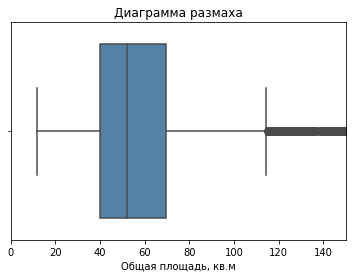

In [14]:
# построим диаграмму размаха, ограничив площадь 150 кв.м
sns.boxplot(data['total_area'], color='steelblue')
plt.title('Диаграмма размаха')
plt.xlabel('Общая площадь, кв.м')
plt.xlim(0, 150)
plt.show()

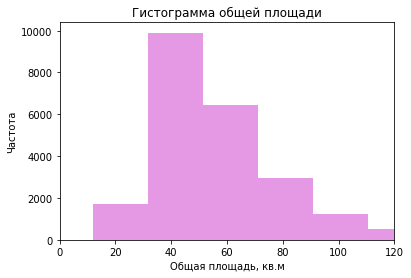

In [15]:
# построим диаграмму для объектов с площадью менее 120 кв.м.
sns.distplot(data['total_area'], kde=False, bins=45, color='m')
plt.xlim(0, 120)
plt.title('Гистограмма общей площади')
plt.xlabel('Общая площадь, кв.м')
plt.ylabel('Частота')
plt.show()

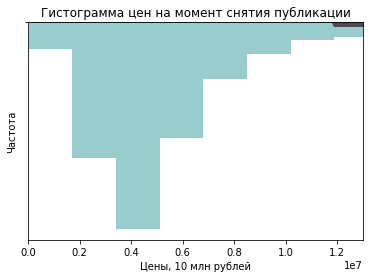

In [16]:
# зададим функцию, вычисляющую долю аномальных значений
def print_anomalies_ratio(column):
    return 'Аномальные значения составляют {:.1%}'. format(len(data.loc[data[column] > boarders(column)[1]]) / len(data)) + ' от всей выборки'
print_anomalies_ratio('total_area')
data['too_large_area'] = data['total_area'] > boarders('total_area')[1]

# построим диаграмму для объектов с ценой менее 13 млн руб
boarders('last_price')
data['last_price'].describe()

sns.boxplot(data['last_price'], color='yellow')
plt.title('Диаграмма размаха')
plt.xlabel('Цены, 13 млн рублей')
_ = plt.xlim(0, 13000000)
sns.distplot(data['last_price'], kde=False, bins=450, color='teal')
plt.xlim(0, 13000000)
plt.title('Гистограмма цен на момент снятия публикации')
plt.xlabel('Цены, 10 млн рублей')
_ = plt.ylabel('Частота')

print_anomalies_ratio('last_price')
data['too_expensive'] = data['last_price'] > boarders('last_price')[1]

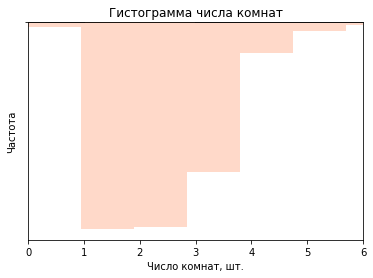

In [17]:
# построим диаграмму для квартир с числом комнат до 6
boarders('rooms')
data['rooms'].describe()

sns.boxplot(data['rooms'], color='green')
plt.title('Диаграмма размаха')
plt.xlabel('Число комнат, шт.')
_ = plt.xlim(0, 10)
sns.distplot(data['rooms'], kde=False, bins=20, color='lightsalmon')
plt.xlim(0, 6)
plt.title('Гистограмма числа комнат')
plt.xlabel('Число комнат, шт.')
_ = plt.ylabel('Частота')
print_anomalies_ratio('rooms')
data['too_many_rooms'] = data['rooms'] > boarders('rooms')[1]


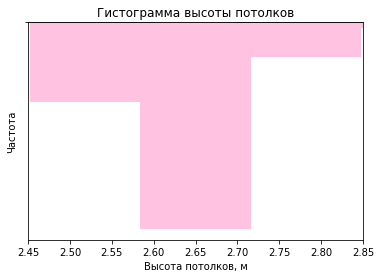

In [18]:
# построим диаграмму для квартир с высотой потолкой до 4 метров
boarders('ceiling_height')
data['ceiling_height'].describe()

sns.boxplot(data['ceiling_height'], color='purple')
plt.title('Диаграмма размаха')
plt.xlabel('Высота потолков, м')
_ = plt.xlim(1, 4)
sns.distplot(data['ceiling_height'], kde=False, bins=750, color='hotpink')
plt.xlim(boarders('ceiling_height')[0], boarders('ceiling_height')[1])
plt.title('Гистограмма высоты потолков')
plt.xlabel('Высота потолков, м')
_ = plt.ylabel('Частота')

print_anomalies_ratio('ceiling_height')
data['unusual_ceiling'] = (data['ceiling_height'] > boarders('ceiling_height')[1]) | (data['ceiling_height'] < boarders('ceiling_height')[0])

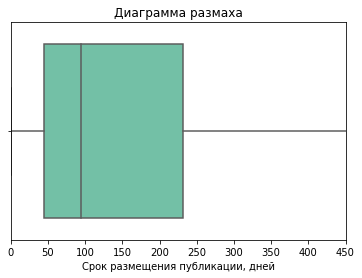

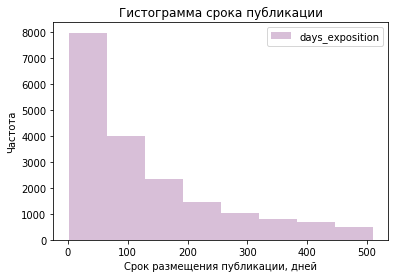

In [19]:
# построим диаграмму для квартир, объявления о которых размещались до 450 дней
boarders('days_exposition')
sns.boxplot(data['days_exposition'], color='mediumaquamarine')

plt.title('Диаграмма размаха')
plt.xlabel('Срок размещения публикации, дней')
_ = plt.xlim(0, 450)
data.plot(y='days_exposition', 
          kind='hist', 
          color='thistle', 
          range=(boarders('days_exposition')[0], boarders('days_exposition')[1]), 
          bins=8)

plt.title('Гистограмма срока публикации')
plt.xlabel('Срок размещения публикации, дней')
_ = plt.ylabel('Частота')
data['days_exposition'].describe()
data['too_slow'] = data['days_exposition'] > boarders('days_exposition')[1]
data['too_fast'] = data['days_exposition'] < 30



Доля чистых значений составила: 64.0%


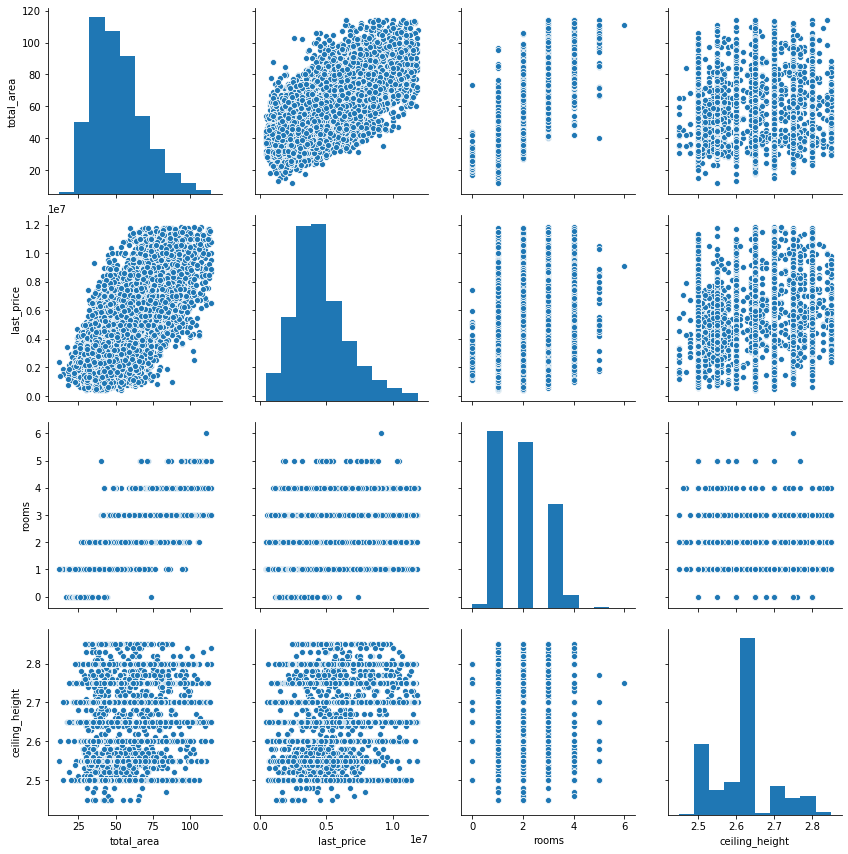

In [20]:
# удалим редкие и выбивающиеся значения
new_data = data[(data['too_large_area'] == False) & 
     (data['too_expensive'] == False) &
     (data['too_many_rooms'] == False) &
     (data['unusual_ceiling'] == False) &
     (data['too_slow'] == False) &
     (data['too_fast'] == False)].reset_index(drop=True)

print('Доля чистых значений составила: {:.1%}'. format(len(new_data) / len(data)))
_ = sns.pairplot(new_data, 
                 vars=['total_area', 'last_price', 'rooms', 'ceiling_height'],
                 height=3)



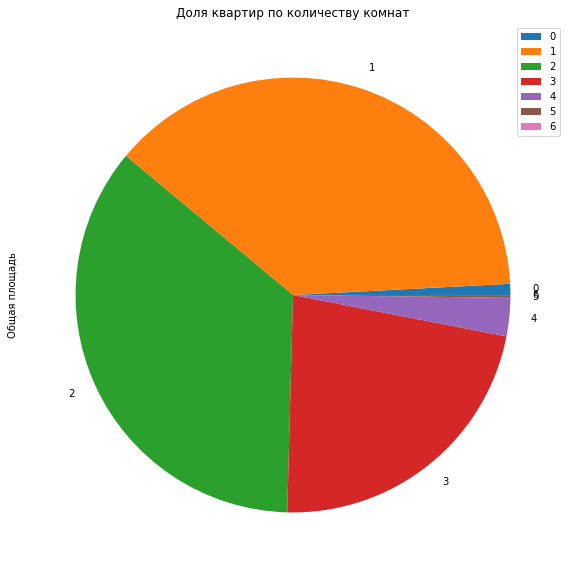

In [21]:
rooms_chart = new_data.pivot_table(index='rooms', values='total_area', aggfunc='count')

# создадим новый столбец 'percent' в 'room_chart', в котором отразим долю каждого вида комнат от всех объявлений
rooms_chart['percent'] = (rooms_chart['total_area'] / rooms_chart['total_area'].sum()) * 100

# нарисуем круговую гистограмму
rooms_chart.plot(y='total_area', kind='pie', figsize=(10, 10), title='Доля квартир по количеству комнат')
plt.ylabel('Общая площадь')
plt.show()

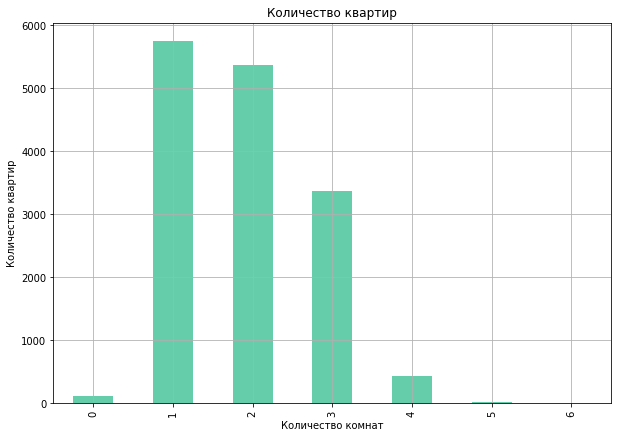

,total_area,percent
rooms,,
0,124,0.821736
1,5753,38.124586
2,5377,35.632869
3,3376,22.372432
4,429,2.842942
5,30,0.198807
6,1,0.006627


In [22]:
# нарисуем столбчатую гистограмму
rooms_chart.plot(y='total_area', kind='bar', figsize=(10, 7), legend=False, grid=True, title='Количество квартир', color='mediumaquamarine')
plt.xlabel('Количество комнат')
plt.ylabel('Количество квартир')
plt.show()
display(rooms_chart)



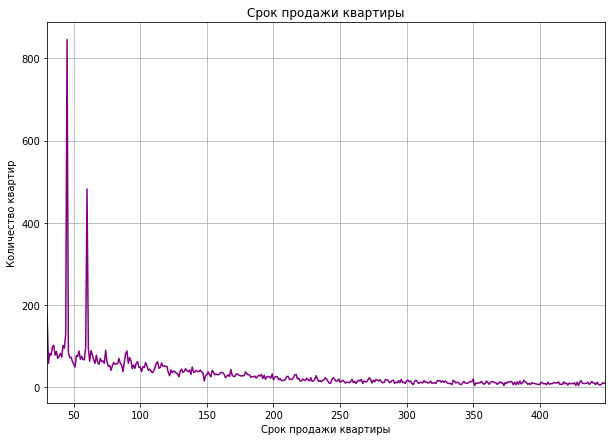

In [23]:
# построим график продаж по датам
days_exposition_drops = new_data.query('days_exposition < 450')
(
    days_exposition_drops
    .query('days_exposition > 0')
    .pivot_table(index='days_exposition', values='first_day_exposition', aggfunc='count')
    .plot(grid=True, figsize=(10, 7), legend=False, color='purple', title='Срок продажи квартиры')
)
plt.ylabel('Количество квартир')
plt.xlabel('Срок продажи квартиры')
plt.show()

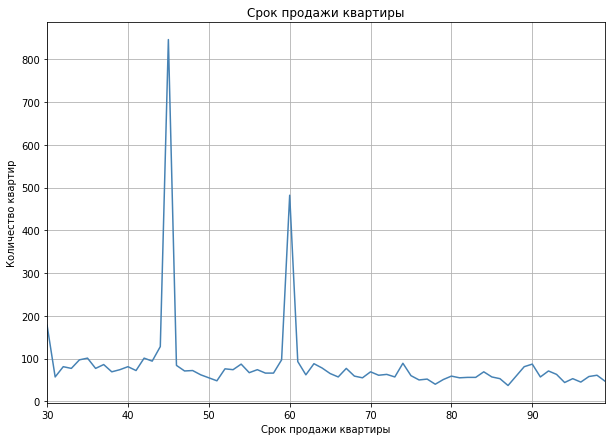

In [24]:
# построим график дней продажи в диапазоне от 0 до 100 дней, т.к. дальнейшие значения будут нерепрезентативными
(
days_exposition_drops
    .query('days_exposition < 100 and days_exposition > 0')
    .pivot_table(index='days_exposition', values='first_day_exposition', aggfunc='count')
    .plot(grid=True, figsize=(10, 7), legend=False, color='steelblue', title='Срок продажи квартиры')
)
plt.ylabel('Количество квартир')
plt.xlabel('Срок продажи квартиры')
plt.show()

In [25]:
# рассчитаем среднее количество и медиану дней продажи
days_exposition_drops = new_data.query('days_exposition < 100')
x = days_exposition_drops.query('days_exposition > 0')['days_exposition'].value_counts()
print('Медиана дней продажи:',  days_exposition_drops['days_exposition'].median())
print('Среднее количество дней продажи:', days_exposition_drops['days_exposition'].mean())
print('Наибольшое количество продаж:')
print('День |  Кол-во продаж')
print(x.head())

Медиана дней продажи: 57.0
Среднее количество дней продажи: 58.99786675418444
Наибольшое количество продаж:
День |  Кол-во продаж
45.0    846
60.0    482
30.0    178
44.0    128
35.0    101
Name: days_exposition, dtype: int64


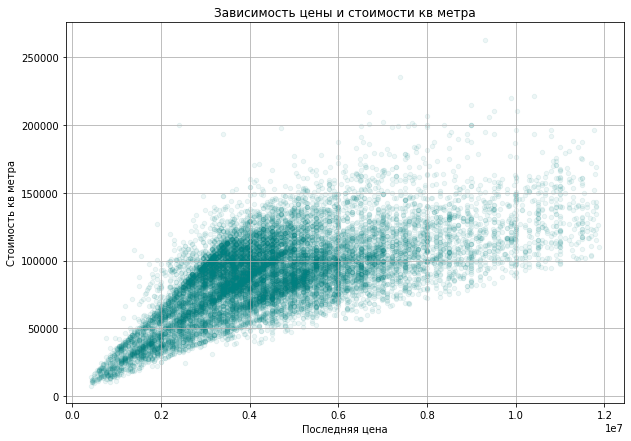

Коэффициент корреляции: 0.647


In [26]:
# построим диаграмму рассеяния по столбцам 'цена' и 'стоимость кв метра'
(
    new_data
    .plot(x='last_price', y='price_per_sqm', kind='scatter', color='teal', title='Зависимость цены и стоимости кв метра', figsize=(10, 7), sharex=False, grid=True, alpha=0.07)
)
plt.xlabel('Последняя цена')
plt.ylabel('Стоимость кв метра')
plt.show()
 
corr_area = new_data['last_price'].corr(new_data['price_per_sqm'])
print('Коэффициент корреляции:', '{:.3f}'.format(corr_area))

In [27]:
# найдем квартиры со стоимостью дороже 15 млн руб и 10 самых дешевых квартир
drop_price = data.query('last_price > 15000000')
print('Количество квартир дороже 15 млн. рублей:', drop_price['last_price'].count(), 'шт.')
print('Топ 10 самых дешёвых квартир:')
price_tails = data.sort_values(by='last_price').head()
print(price_tails['last_price'])

Количество квартир дороже 15 млн. рублей: 1195 шт.
Топ 10 самых дешёвых квартир:
8793      12190
17456    430000
14911    430000
16274    440000
9581     450000
Name: last_price, dtype: int64


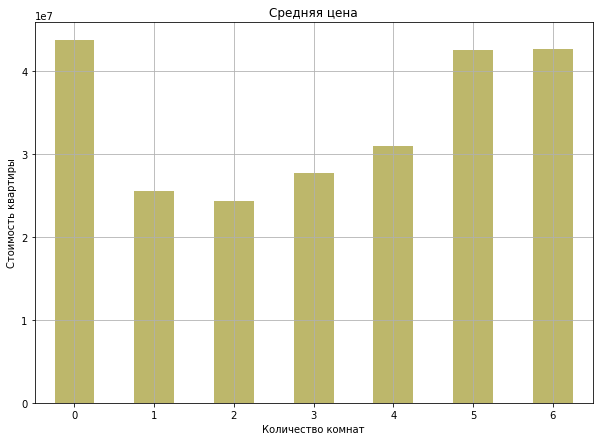

In [28]:
# построим график зависимости количества комнат и средней цены
# гистограмма "Средняя цена"
(
    drop_price
    .query('rooms < 7')
    .pivot_table(index='rooms', values='last_price', aggfunc='mean')
    .plot(y='last_price', kind='bar', figsize=(10, 7), title='Средняя цена', grid=True, legend=False, color='darkkhaki')
)
plt.ylabel('Стоимость квартиры')
plt.xlabel('Количество комнат')
plt.xticks(rotation = 0)
plt.show()

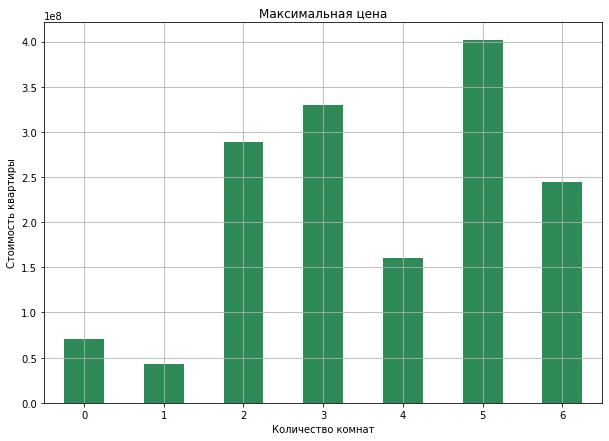

In [29]:
# гистограмма "Максимальная цена"
(
    drop_price
    .query('rooms < 7')
    .pivot_table(index='rooms', values='last_price', aggfunc='max')
    .plot(y='last_price', kind='bar', figsize=(10, 7), title='Максимальная цена', grid=True, legend=False, color='seagreen')
)
plt.ylabel('Стоимость квартиры')
plt.xlabel('Количество комнат')
plt.xticks(rotation = 0)
plt.show()

In [30]:
# посчитаем среднюю стоимость квартир
print('Средняя стоимость квартир:', '{:.2f}'.format(new_data['last_price'].mean()), 'рублей')

Средняя стоимость квартир: 4601005.30 рублей


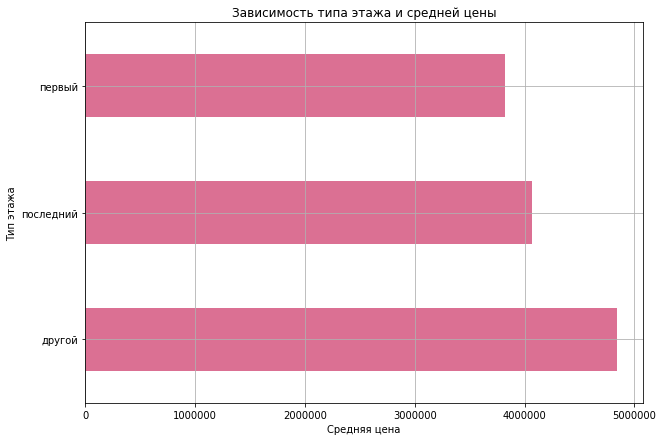

In [31]:
# построим график зависимости типа этажа и средней цены
(
    new_data
    .pivot_table(index = 'floor_category', values = 'last_price', aggfunc= 'mean')
    .sort_values(by='last_price', ascending=False)
    .plot(y='last_price', kind='barh', title='Зависимость типа этажа и средней цены', figsize=(10, 7), color='palevioletred', legend=False, grid=True, ylim=(3800, 5000))
)
plt.xlabel('Средняя цена')
plt.ylabel('Тип этажа')
plt.show()

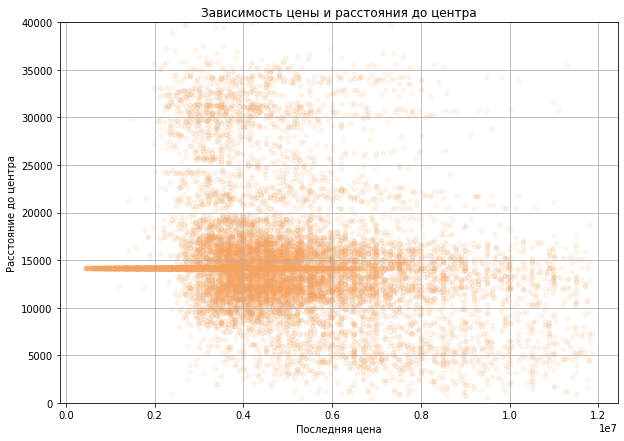

Коэффициент корреляции: -0.188


In [32]:
# построим диаграмму рассеяния по столбцам 'цена' и 'расстояние до центра'
(
    new_data
    .query('cityCenters_nearest != 1')
    .plot(x='last_price', y='cityCenters_nearest', kind='scatter', color='sandybrown', title='Зависимость цены и расстояния до центра', figsize=(10, 7), sharex=False, grid=True, alpha=0.1, ylim=(0, 40000))
)
plt.xlabel('Последняя цена')
plt.ylabel('Расстояние до центра')
plt.show()
corr_center = new_data['last_price'].corr(new_data['cityCenters_nearest'])
print('Коэффициент корреляции:', '{:.3f}'.format(corr_center))

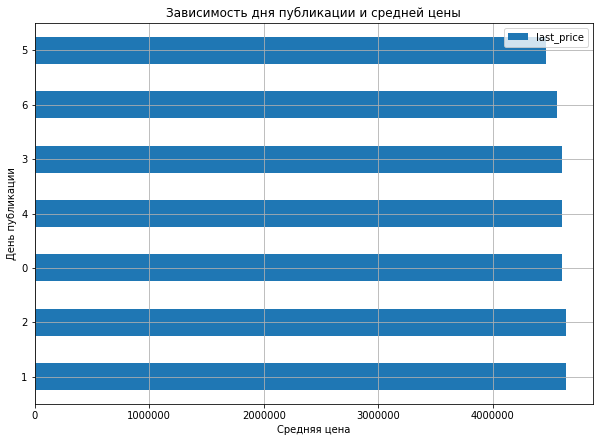

In [33]:
# построим график зависимости дня публикации и средней цены
(
    new_data
    .pivot_table(index = 'weekday', values = 'last_price', aggfunc= 'mean')
    .sort_values(by='last_price', ascending=False)
    .plot(y='last_price', kind='barh', title='Зависимость дня публикации и средней цены', figsize=(10, 7), legend=True, grid=True, ylim=(2000, 11000))
)
plt.xlabel('Средняя цена')
plt.ylabel('День публикации')
plt.show()
 

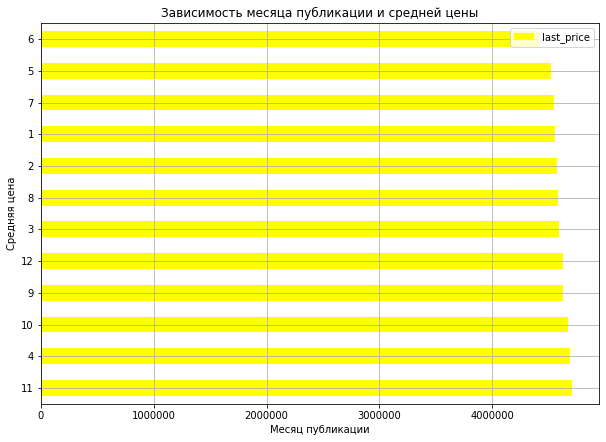

In [34]:
# построим график зависимости месяца публикации и средней цены
(
    new_data
    .pivot_table(index = 'month', values = 'last_price', aggfunc= 'mean')
    .sort_values(by='last_price', ascending=False)
    .plot(y='last_price', kind='barh', title='Зависимость месяца публикации и средней цены', color='yellow', figsize=(10, 7), legend=True, grid=True, ylim=(2000, 11000))
)
plt.xlabel('Месяц публикации')
plt.ylabel('Средняя цена')
plt.show()


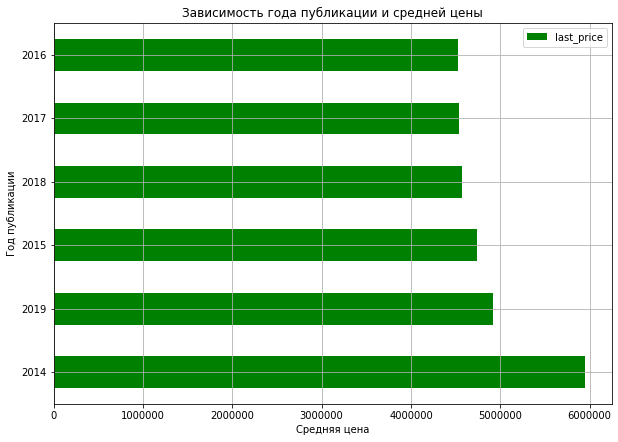

In [35]:
# построим график зависимости года публикации и средней цены
(
    new_data
    .pivot_table(index = 'year', values = 'last_price', aggfunc= 'mean')
    .sort_values(by='last_price', ascending=False)
    .plot(y='last_price', kind='barh', title='Зависимость года публикации и средней цены', color='green', figsize=(10, 7), legend=True, grid=True, ylim=(2000, 11000))
)
plt.xlabel('Средняя цена')
plt.ylabel('Год публикации')
plt.show()

In [36]:
# определим 10 населенных пунктов с наибольшим количеством объявлений
( 
    new_data
    .pivot_table(index='locality_name', values='last_price', aggfunc='count')
    .sort_values(by='last_price', ascending=False)
    .head(10)
)

,last_price
locality_name,
Санкт-Петербург,9099
посёлок Мурино,372
посёлок Шушары,348
Всеволожск,314
посёлок Парголово,260
Колпино,237
Пушкин,233
Гатчина,223
деревня Кудрово,216


In [37]:
# вычислим среднюю стоимость за квадратный метр среди 10 населенных пунктов с наибольшим количеством объявлений
(
    new_data
    .query('locality_name == "Санкт-Петербург" | locality_name == "посёлок Мурино" | locality_name == "посёлок Шушары" | locality_name == "Всеволожск" | locality_name == "Колпино" | locality_name == "посёлок Парголово" | locality_name == "деревня Кудрово" | locality_name == "Пушкин" | locality_name == "Гатчина" | locality_name == "Выборг"')
    .pivot_table(index='locality_name', values='price_per_sqm', aggfunc='mean')
    .sort_values(by='price_per_sqm', ascending=False)
)

,price_per_sqm
locality_name,
Санкт-Петербург,104814.663809
Пушкин,98937.892704
деревня Кудрово,92909.930556
посёлок Парголово,90019.415385
посёлок Мурино,85552.408602
посёлок Шушары,78786.206897
Колпино,75114.611814
Гатчина,67950.017937
Всеволожск,67153.977707


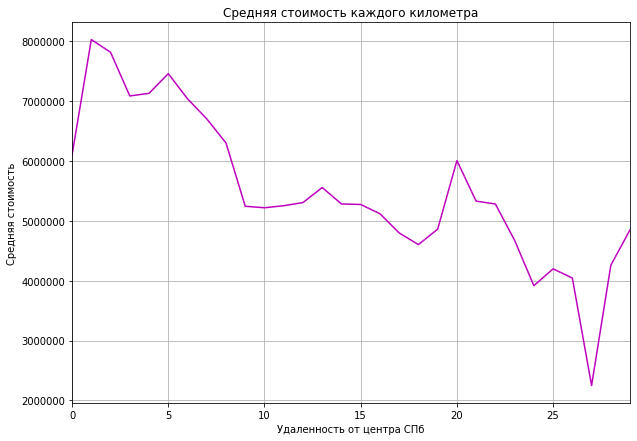

In [38]:
# вычислим центр Санкт-Петербурга
spb_data = new_data.copy().query('cityCenters_nearest != 1 and locality_name == "Санкт-Петербург"')
 
spb_data['spb_centre'] = (spb_data['cityCenters_nearest'] / 1000).round().astype('int')
spb_data_price = spb_data.groupby('spb_centre', as_index = False).agg({'last_price' : 'mean'})
spb_data_price.plot(x='spb_centre', y='last_price', legend=False, color='m', grid=True, figsize=(10, 7), title='Средняя стоимость каждого километра')
plt.ylabel('Средняя стоимость')
plt.xlabel('Удаленность от центра СПб')
plt.show()

In [39]:
# выделим сегмент квартир в центре Санкт-Петербурга
spb_data_center = spb_data.query('spb_centre < 9')

# добавим столбец с расстоянием до центра в километрах
spb_data = data.copy().query('cityCenters_nearest != 0.1 and locality_name == "Санкт-Петербург"')
spb_data['spb_centre'] = (spb_data['cityCenters_nearest'] / 1000).round().astype('int')
display(spb_data.head())

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,floor_category,living_area_ratio,kitchen_area_ratio,too_large_area,too_expensive,too_many_rooms,unusual_ceiling,too_slow,too_fast,spb_centre
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.000000,8,False,...,другой,0.47,0.23,False,True,False,False,False,False,16
2,10,5196000,56.0,2015-08-20,2,2.65,5,34.300000,4,False,...,другой,0.61,0.15,False,False,False,False,True,False,14
3,0,64900000,159.0,2015-07-24,3,2.65,14,34.457852,9,False,...,другой,0.22,0.07,True,True,False,False,False,False,7
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.000000,13,False,...,другой,0.32,0.41,False,False,False,True,False,False,8
7,5,7915000,71.6,2019-04-18,2,2.65,24,34.457852,22,False,...,другой,0.48,0.26,False,False,False,False,False,False,12


In [40]:
# изучим данные по квартирам в центре Санкт-Петербурга
columns_list = ['total_area', 'last_price', 'rooms', 'ceiling_height']

for x in columns_list:
    print(spb_data_center[x].describe())
    print('')
    
# изучим данные по квартирам во всем массиве данных
columns_list = ['total_area', 'last_price', 'rooms', 'ceiling_height']

for x in columns_list:
    print(new_data[x].describe())
    print('')

count    1204.000000
mean       60.280689
std        20.078726
min        12.000000
25%        44.000000
50%        58.400000
75%        73.000000
max       114.200000
Name: total_area, dtype: float64

count    1.204000e+03
mean     6.999223e+06
std      2.215091e+06
min      2.400000e+06
25%      5.250000e+06
50%      6.800000e+06
75%      8.600000e+06
max      1.186686e+07
Name: last_price, dtype: float64

count    1204.000000
mean        2.090532
std         0.910424
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
max         6.000000
Name: rooms, dtype: float64

count    1204.000000
mean        2.654244
std         0.077975
min         2.460000
25%         2.650000
50%         2.650000
75%         2.650000
max         2.850000
Name: ceiling_height, dtype: float64

count    15090.000000
mean        51.618546
std         16.863185
min         12.000000
25%         38.500000
50%         48.000000
75%         62.000000
max        114.200000
Name: tot

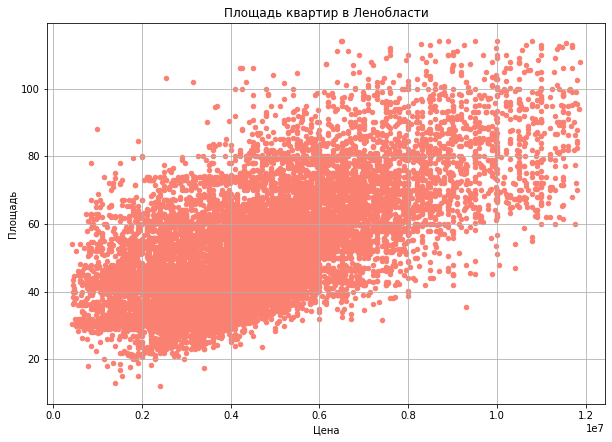

In [41]:
# построим диаграмму рассеяния по столбцам 'цена' и 'площадь' для всего массива данных
(
    new_data
    .plot(x='last_price', y='total_area', kind='scatter', color='salmon', title='Площадь квартир в Ленобласти', figsize=(10, 7), sharex=False, grid=True)
)
plt.xlabel('Цена')
plt.ylabel('Площадь')
plt.show()

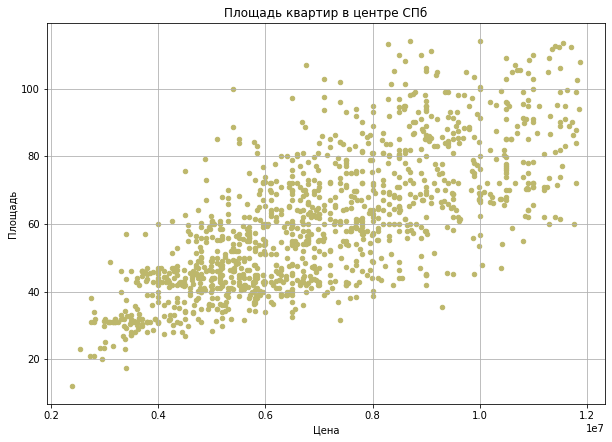

In [42]:
# построим диаграмму рассеяния по столбцам 'цена' и 'площадь' для центра Санкт-Петербурга
(
    spb_data_center
    .plot(x='last_price', y='total_area', kind='scatter', color='darkkhaki', title='Площадь квартир в центре СПб', figsize=(10, 7), sharex=False, grid=True)
)
plt.xlabel('Цена')
plt.ylabel('Площадь')
plt.show()

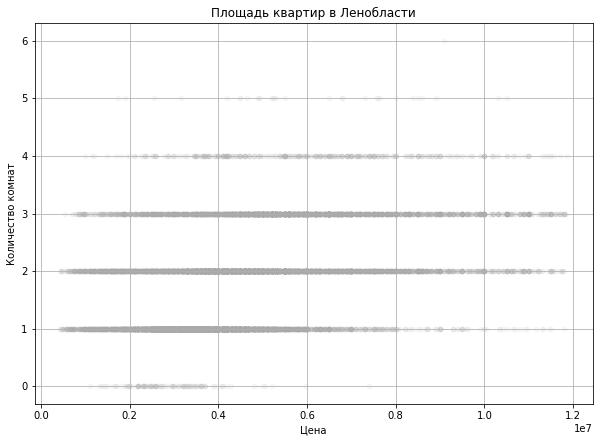

In [43]:
# построим диаграмму рассеяния по столбцам 'цена' и 'количество комнат' для всего массива данных
(
    new_data
    .plot(x='last_price', y='rooms', kind='scatter', color='darkgrey', title='Площадь квартир в Ленобласти', figsize=(10, 7), sharex=False, grid=True, alpha=0.07)
)
plt.xlabel('Цена')
plt.ylabel('Количество комнат')
plt.show()

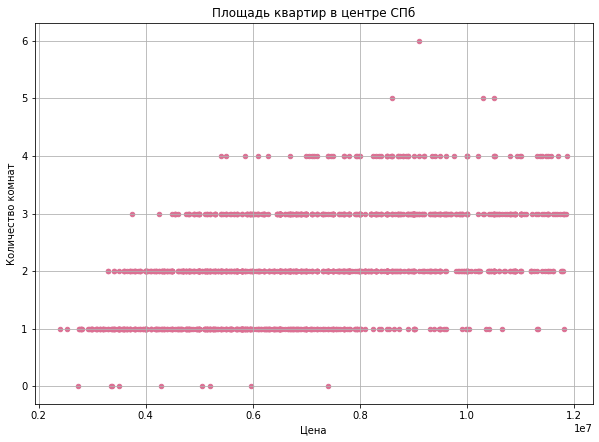

In [44]:
# построим диаграмму рассеяния по столбцам 'цена' и 'количество комнат' для центра Санкт-Петербурга
(
    spb_data_center
    .plot(x='last_price', y='rooms', kind='scatter', color='palevioletred', title='Площадь квартир в центре СПб', figsize=(10, 7), sharex=False, grid=True)
)
plt.xlabel('Цена')
plt.ylabel('Количество комнат')
plt.show()

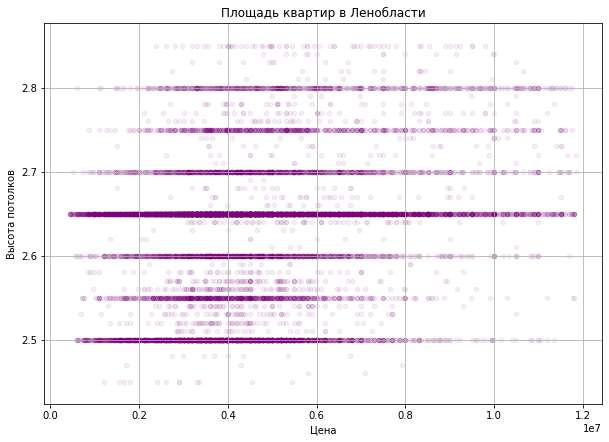

In [45]:
# построим диаграмму рассеяния по столбцам 'цена' и 'высота потолков' для всего массива данных
(
    new_data
    .plot(x='last_price', y='ceiling_height', kind='scatter', color='purple', title='Площадь квартир в Ленобласти', figsize=(10, 7), sharex=False, grid=True, alpha=0.07)
)
plt.xlabel('Цена')
plt.ylabel('Высота потолков')
plt.show()

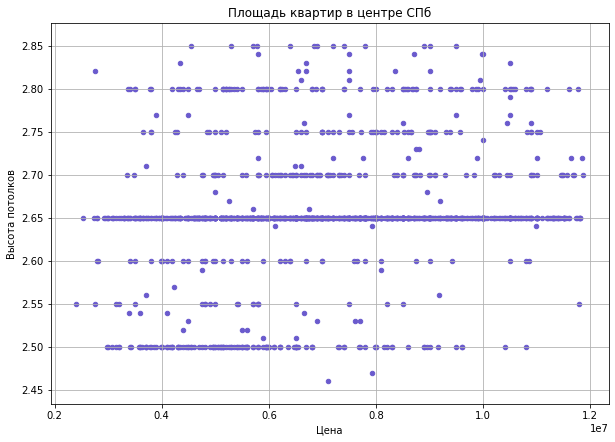

In [46]:
# построим диаграмму рассеяния по столбцам 'цена' и 'высота потолков' для центра Санкт-Петербурга
(
    spb_data_center
    .plot(x='last_price', y='ceiling_height', kind='scatter', color='slateblue', title='Площадь квартир в центре СПб', figsize=(10, 7), sharex=False, grid=True)
)
plt.xlabel('Цена')
plt.ylabel('Высота потолков')
plt.show()

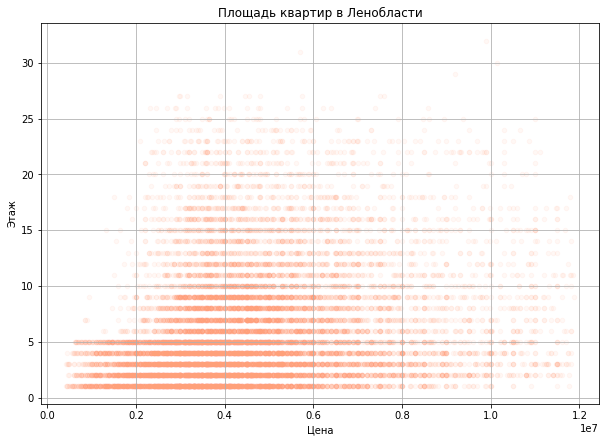

In [47]:
# построим диаграмму рассеяния по столбцам 'цена' и 'этаж' для всего массива данных
(
    new_data
    .plot(x='last_price', y='floor', kind='scatter', color='lightsalmon', title='Площадь квартир в Ленобласти', figsize=(10, 7), sharex=False, grid=True, alpha=0.07)
)
plt.xlabel('Цена')
plt.ylabel('Этаж')
plt.show()

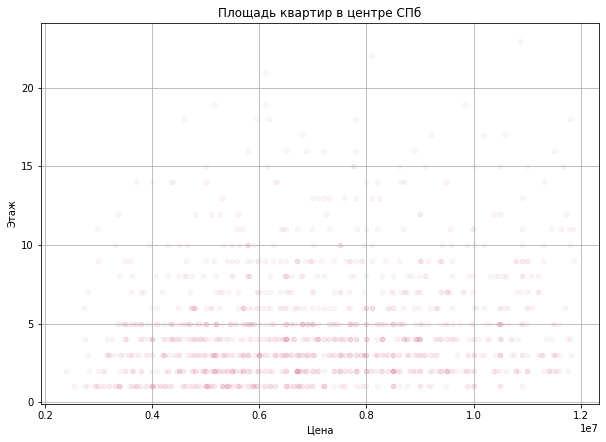

In [48]:
# построим диаграмму рассеяния по столбцам 'цена' и 'этаж' для центра Санкт-Петербурга
(
    spb_data_center
    .plot(x='last_price', y='floor', kind='scatter', color='palevioletred', title='Площадь квартир в центре СПб', figsize=(10, 7), sharex=False, grid=True, alpha=0.07)
)
plt.xlabel('Цена')
plt.ylabel('Этаж')
plt.show()

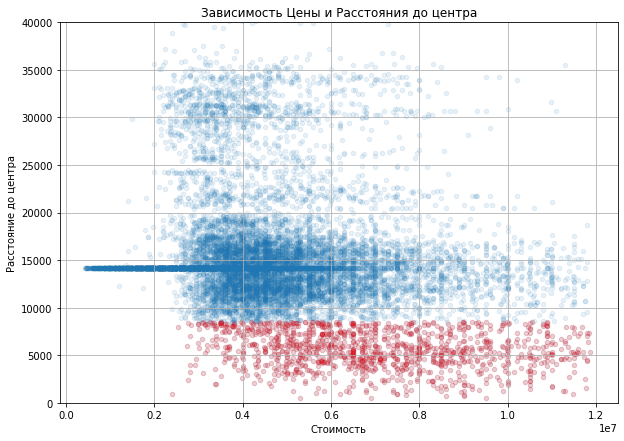

Коэффициент корреляции для всех населенных пунктов: -0.188
Коэффициент корреляции для центра Санкт-Петербурга: -0.177


In [49]:
# построим диаграмму рассеяния по столбцам 'цена' и 'расстояние до центра' для всех населённых пунктов
ax = (
    new_data
    .query('cityCenters_nearest != 1')
    .plot(x='last_price', y='cityCenters_nearest', kind='scatter', figsize=(6, 4), sharex=False, grid=True, alpha=0.1, ylim=(0, 40000))
)

# построим диаграмму рассеяния по столбцам 'цена' и 'расстояние до центра' для центра Санкт-Петербурга
(
    spb_data_center
    .query('cityCenters_nearest != 1')
    .plot(x='last_price', y='cityCenters_nearest', kind='scatter', title='Зависимость Цены и Расстояния до центра', ax=ax, color='r', alpha=0.15, figsize=(10, 7), sharex=False, grid=True, ylim=(0, 40000))
)
plt.ylabel('Расстояние до центра')
plt.xlabel('Cтоимость')
plt.show()
corr_center = new_data['last_price'].corr(new_data['cityCenters_nearest'])
print('Коэффициент корреляции для всех населенных пунктов:', '{:.3f}'.format(corr_center))
corr_center = spb_data_center['last_price'].corr(spb_data_center['cityCenters_nearest'])
print('Коэффициент корреляции для центра Санкт-Петербурга:', '{:.3f}'.format(corr_center))


In [50]:
# посмотрим, как цена за квадрат коррелирует с площадью/комнатами
new_data[['total_area', 'price_per_sqm', 'rooms']].corr()

,total_area,price_per_sqm,rooms
total_area,1.000000,-0.084075,0.800659
price_per_sqm,-0.084075,1.000000,-0.243801
rooms,0.800659,-0.243801,1.000000


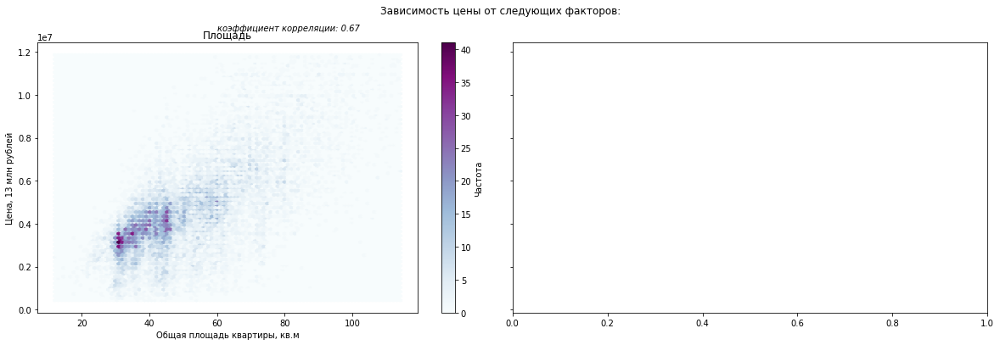

In [51]:
# построим график зависимости цены от общей площади
fig, [ax1, ax2] = plt.subplots(1, 2, sharey=True, figsize=(17, 6), gridspec_kw={'wspace': 0})
fig.suptitle('Зависимость цены от следующих факторов:')

ax1.set_title('Площадь')
ax1.set_ylabel('Цена, 13 млн рублей')
ax1.set_xlabel('Общая площадь квартиры, кв.м')
ax1.text(60, 13000000, 
         'коэффициент корреляции: ' + str(round(new_data['last_price'].corr(new_data['total_area']), 2)), 
         style='italic')
hb1 = ax1.hexbin(new_data['total_area'], new_data['last_price'], cmap='BuPu')
cb1 = fig.colorbar(hb1, ax=ax1)
cb1.set_label('Частота')

plt.tight_layout(pad=3)
plt.show()

In [52]:
# отделим центр от области
spb_data = data.query('locality_name == "Санкт-Петербург"')

spb_data['type_center']= spb_data.loc[spb_data['cityCenters_nearest'] <= 9000, 'type_center']='сenter'
spb_data.loc[spb_data['cityCenters_nearest'] > 9000, 'type_center']='outside_center'


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [53]:
# уберем выбросы с учетом 1.5 размаха
def quartile_range(df, column):
    
    """
    функция для подсчета границ с учетом 1.5 размаха
    """
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    dfq = df.loc[(df[column] < q3 + 1.5*iqr) & (df[column] > q1 - 1.5*iqr), column]
    return dfq

list_features = ['last_price', 'total_area', 'kitchen_area', 'living_area', 'days_exposition', 'ceiling_height', 'rooms', 'price_per_sqm']

for col in list_features:
    
    spb_data[col]=quartile_range(spb_data, col)
    
display(spb_data.describe())

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,...,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,price_per_sqm,weekday,month,year,living_area_ratio,kitchen_area_ratio
count,15651.000000,1.431300e+04,14740.000000,15466.000000,13332.000000,15651.000000,14927.000000,15651.000000,14504.000000,15651.000000,...,15651.000000,15651.000000,15651.000000,12428.000000,14806.000000,15651.000000,15651.000000,15651.000000,15651.000000,15651.000000
mean,10.201648,5.984245e+06,57.464681,2.115027,2.639569,11.395885,33.048143,6.224011,9.778791,0.584116,...,230.876685,0.767235,263.869657,127.860154,106706.456707,2.554022,6.422082,2017.353140,0.571921,0.189421
std,5.746729,2.532845e+06,21.608100,1.008351,0.090268,6.372330,14.007424,4.886328,2.989667,0.968118,...,341.477438,0.924810,328.000482,121.830454,22680.351197,1.778952,3.467270,1.057189,0.132003,0.078665
min,0.000000,1.219000e+04,12.000000,0.000000,2.400000,1.000000,2.000000,1.000000,1.300000,0.000000,...,0.000000,0.000000,0.000000,1.000000,41025.000000,0.000000,1.000000,2014.000000,0.020000,0.020000
25%,6.000000,4.100000e+06,41.000000,1.000000,2.600000,5.000000,20.000000,3.000000,7.200000,0.000000,...,0.000000,0.000000,0.000000,37.000000,90270.000000,1.000000,3.000000,2017.000000,0.500000,0.130000
50%,10.000000,5.250000e+06,53.000000,2.000000,2.650000,9.000000,32.000000,5.000000,10.000000,0.000000,...,0.000000,1.000000,43.000000,85.000000,103115.000000,2.000000,6.000000,2017.000000,0.570000,0.170000
75%,14.000000,7.200000e+06,70.000000,3.000000,2.650000,16.000000,41.500000,8.000000,11.100000,1.000000,...,441.000000,1.000000,510.000000,181.000000,120370.000000,4.000000,10.000000,2018.000000,0.640000,0.230000
max,50.000000,1.407362e+07,123.200000,5.000000,2.970000,52.000000,77.710000,33.000000,18.700000,5.000000,...,3190.000000,3.000000,1337.000000,514.000000,174538.000000,6.000000,12.000000,2019.000000,2.650000,0.880000


In [54]:
# построим график с типичными характеристиками квартир
columns = ['total_area', 'last_price', 'rooms', 'ceiling_height', 'kitchen_area', 'living_area', 'price_per_sqm']

for col in columns:
    
    fig = px.histogram(spb_data, x = col, marginal = 'box', color = 'type_center', title = 'Распределение '+col)
    fig.show()


Видим, что распределение объектов центра сдвинуто вправо, значит они обладают лучшими характеристиками и более высокими показателями.  

In [55]:
# зависимость с категориальным, пример 
fig = px.line(spb_data.pivot_table(index = ['type_center', 'floor_category'], values = 'last_price', aggfunc = 'mean').reset_index(),
             x = 'floor_category', y = 'last_price', color = 'type_center')
fig.show()

# корреляция, пример
display(spb_data.pivot_table(index = 'type_center', values = columns, aggfunc = 'corr'))

ceiling_height  kitchen_area  last_price  \
type_center                                                               
outside_center total_area            0.194613      0.438538    0.818859   
               last_price            0.288809      0.521132    1.000000   
               rooms                -0.070067      0.031725    0.509056   
               ceiling_height        1.000000      0.439217    0.288809   
               kitchen_area          0.439217      1.000000    0.521132   
               living_area           0.044243      0.208163    0.636353   
               price_per_sqm         0.252666      0.276521    0.389190   
сenter         total_area            0.167638      0.420372    0.737547   
               last_price            0.198437      0.467562    1.000000   
               rooms                 0.082544      0.190505    0.520042   
               ceiling_height        1.000000      0.202003    0.198437   
               kitchen_area          0.202003      1.000000    0.467562   
               living_area           0.136925      0.230339    0.565990   
               price_per_sqm         0.050669      0.110535    0.229492   

                               living_area  price_per_sqm     rooms  \
type_center                                                           
outside_center total_area         0.865703      -0.060320  0.773323   
               last_price         0.636353       0.389190  0.509056   
               rooms              0.852581      -0.291703  1.000000   
               ceiling_height     0.044243       0.252666 -0.070067   
               kitchen_area       0.208163       0.276521  0.031725   
               living_area        1.000000      -0.183912  0.852581   
               price_per_sqm     -0.183912       1.000000 -0.291703   
сenter         total_area         0.832940      -0.146483  0.762721   
               last_price         0.565990       0.229492  0.520042   
               rooms              0.770723      -0.279695  1.000000   
               ceiling_height     0.136925       0.050669  0.082544   
               kitchen_area       0.230339       0.110535  0.190505   
               living_area        1.000000      -0.237995  0.770723   
               price_per_sqm     -0.237995       1.000000 -0.279695   

                               total_area  
type_center                                
outside_center total_area        1.000000  
               last_price        0.818859  
               rooms             0.773323  
               ceiling_height    0.194613  
               kitchen_area      0.438538  
               living_area       0.865703  
               price_per_sqm    -0.060320  
сenter         total_area        1.000000  
               last_price        0.737547  
               rooms             0.762721  
               ceiling_height    0.167638  
               kitchen_area      0.420372  
               living_area       0.832940  
               price_per_sqm    -0.146483

Видим, что как в центре, так и в области крайние этажи не пользуются спросом.

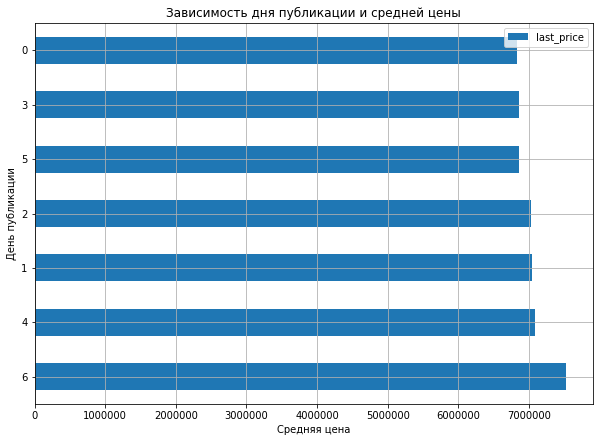

In [56]:
# построим график зависимости дня публикации и средней цены в центре
(
    spb_data_center
    .pivot_table(index = 'weekday', values = 'last_price', aggfunc= 'mean')
    .sort_values(by='last_price', ascending=False)
    .plot(y='last_price', kind='barh', title='Зависимость дня публикации и средней цены', figsize=(10, 7), legend=True, grid=True, ylim=(2000, 11000))
)
plt.xlabel('Средняя цена')
plt.ylabel('День публикации')
plt.show()


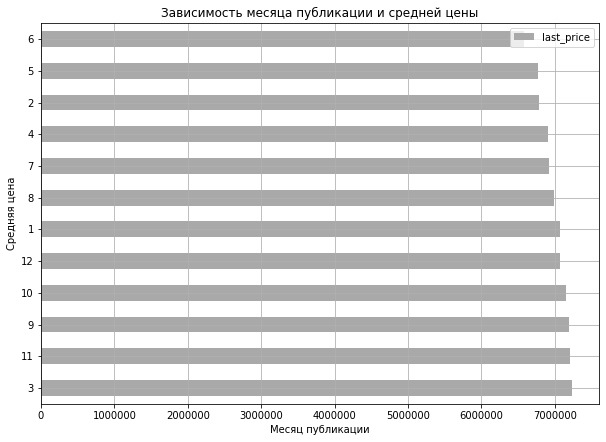

In [57]:
# построим график зависимости месяца публикации и средней цены в центре
(
    spb_data_center
    .pivot_table(index = 'month', values = 'last_price', aggfunc= 'mean')
    .sort_values(by='last_price', ascending=False)
    .plot(y='last_price', kind='barh', title='Зависимость месяца публикации и средней цены', color='darkgrey', figsize=(10, 7), legend=True, grid=True, ylim=(2000, 11000))
)
plt.xlabel('Месяц публикации')
plt.ylabel('Средняя цена')
plt.show()


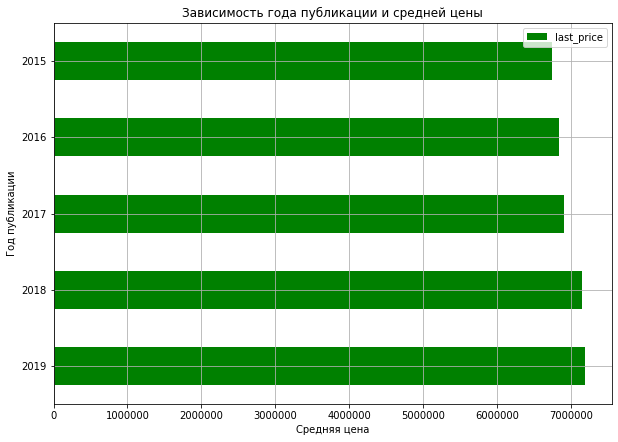

In [58]:
# построим график зависимости года публикации и средней цены в центре
(
    spb_data_center
    .pivot_table(index = 'year', values = 'last_price', aggfunc= 'mean')
    .sort_values(by='last_price', ascending=False)
    .plot(y='last_price', kind='barh', title='Зависимость года публикации и средней цены', color='green', figsize=(10, 7), legend=True, grid=True, ylim=(2000, 11000))
)
plt.xlabel('Средняя цена')
plt.ylabel('Год публикации')
plt.show()

**Выводы**  
  
Изучив распределение квартир по количеству комнат выявили:  
  
Рассмотрев корреляцию количества квартир и количества комнат видим, что **больше всего продавалось однокомнатных квартир**, двухкомнатных квартир продано не намного меньше, 5-ти и 6-ти комнатных квартир продано меньше всего.  
Количество комнат более 6-ти (от 7 до 19) можно считать аномальными значениями, но не стали исключать их общей базы.   Возможно, это элитное жилье, бывшие коммунальные квартиры или помещения, которые использовались в качестве нежилых.
  
Рассмотрев сроки продажи квартир после публикации объявления видим, что **большее количество продаж происходит на сроке до 100 дней**, есть 2 пика на 45 и 60 днях.  
Можно сказать, что квартира продана быстро, если с момента публикации объявления прошло менее 45 дней, и что квартира продавалась долго, если с момента публикации прошло более 100 дней.  
На сроке 180 дней на графике видим резкий скачок в несколько раз превышающий предыдущие пики – скорее всего, это аномальные значения.  
  
**Средняя стоимость квартиры составляет 6541548.77 рублей.**  
Количество квартир дороже 15 млн. рублей: 1204 шт.  
  
Рассмотрев зависимость средней цены от количества комнат в диапазоне от 1 до 6 комнат видим, что **цена растет пропорционально количеству комнат**, однако цена на квартиры с 0 комнат примерно равна ценам на квартиры с 5 и 6 комнатами. Это может происходить из-за аномалий в данных либо из-за ошибок при внесении данных (вместо 0 должно быть другое количество комнат).  
  
Максимальная цена выявлена на квартиры с 5 комнатами, а минимальная – с 1 комнатой.
  
Анализ показал, что коэффициент корреляции Пирсона между ценой и стоимостью квадратного метра равен 0,736, это говорит о том, что **между параметрами "цена" и "стоимость квадратного метра" имеется положительная корреляция - прямая зависимость**.  
Стоимость квадрата малогабаритных квартир дороже.  
  
**Наиболее продаваемы квартиры с площадью от 30 до 50 кв метров.**
  
Наибольшая концентрация объявлений находится в ячейке с параметрами: цена - 4-7 млн. рублей и общая площадь - 40-70 м², это говорит о том, что больше всего объявлений имеют данные параметры.

Зависимость цены и растояния от центра следующая: **максимальная цена на квартиры выявляется на расстоямии примерно до 5 км от центра**, далее равномерно падает до 17 км от центра, от 17 до 35 км до центра цены распределяются равномерно.     
У нас явная отрицательная корреляция цены и расстояния.  
  
Изучив зависимость дня публикации и средней цены в центре города, можно сделать вывод, что **объявления с квартирами с наибольшей стоимостью публиковались по субботам**, а с квартирами по наименьшей стоимости – по пятницам.  
Кроме того, **объявления с квартирами с наибольшей стоимостью публиковались в марте, сентябре и октябре**, а квартиры по наименьшей стоимости – в июне.  
**Объявления с квартирами с наибольшей стоимостью публиковались в 2019 году**, а с квартирами по наименьшей стоимости – в 2015 году.
  
**Дороже всего квартиры, находящиеся не на первом и не на последнем этажах**, а дешевле всего – на первом этаже.
  
**10 населённых пунктов с наибольшим числом объявлений:**  
- Санкт-Петербург  
- Пушкин, деревня Кудрово  
- поселок Парголово  
- поселок Мурино  
- поселок Шушары  
- Колпино  
- Гатчина  
- Всеволожск  
- Выборг  
  
Из них **наибольшая стоимость квадратного метра в Санкт-Петербурге (114 785 р)**, а наименьшая – в Выборге (58 141 р), то есть в 2 раза ниже, чем в Санкт-Петербурге.
  
При изучении графика удаленности от центра Санк-Петербурга можно увидеть снижение цены в районе 9 км, это расстояние можно считать границей центра города.

**Сравним некоторые параметры квартир в центре Санкт-Петербурга и во всем массиве данных**:
  
Средняя площадь квартиры в центре Санкт-Петербурга составляет 90 кв метров, тогда как в Ленинградской области – 60 кв метров.   
Средняя цена в центре Санкт-Петербурга – 14 млн руб, в Ленинградской области –6,5 млн руб.  
Среднее количество комнат в центре Санкт-Петербурга 2-3 комнаты (2,75),в Ленинградской области –2 комнаты.  
Средняя высота потлков в центре Санкт-Петербурга составляет 3 метра, тогда как в Ленинградской области – 2,7 метров.  
При рассмотрении графиков выявлено, что число комнат, этаж, дата размещения объявления имеют такое же влияние на стоимость квартир в Санкт-Петербурге, как и на стоимость квартир в Ленинградской области.  
Зависимость цены и растояния от центра следующая: максимальная цена на квартиры выявляется на расстоямии примерно 5 км от центра, далее равномерно падает до 17 км от центра, от 17 до 35 км до центра цены распределяются равномерно.  

**Общий вывод**  
  
Проведя комплексный анализ данных сервиса Яндекс.Недвижимость в Санкт-Петербурге и соседних населенных пунктах удалось выявить наиболее значимые параметры, которые влияют на формирование стоимости квартиры:  
  
* Цена положительно коррелирует с площадью/количеством комнат, однако цена за квадрат - наоборот отрицательно, иными словами, квадрат однокомнатной квартиры дороже, чем квадрат трехкомнатной  
  
* Крайние этажи не пользуются особой популярностью  
  
* Чем дальше от центра, тем стоимость квартиры ниже  
  
* И в центре, и в области есть подверженность влиянию дней недели, сезонности, а также вероятно экономических факторов  
  
* Объекты в центре обладают в целом схожей тенденцией по корреляции, но имеют куда лучшие характеристики, чем объекты в области 
